NO CODE EXECUTION HERE, CODE WITH OUTPUTS SHOULD ONLY BE PASTED IN THIS DOCUMENT!!!

# Deep Painterly Harmonization
![alt text](https://drive.google.com/uc?id=1T6X-DbvL9FCXJ0g31FRd805EsLPsAC_U)

Paper: https://arxiv.org/abs/1804.03189

---

#### Content

1.   Introduction/Motivation
2.   Important background knowledge (including reference to most relevant publications)
3.   The model and the experiment (MAIN PART). This part should feature code.
4.   Visualization and discussion of your results.

---


# Introduction

Nowadays, deep neural networks can be used to create pieces of art. Well known is especially Neural Style Transfer. A technique where the style of an image can be applied to another one. Many fancy pictures have been created since Neural Style Transfer was first published in the paper 'A Neural Algorithm of Artistic Style' by Gatys et al. in 2015.  

But what if someone doesn't want to create a completely new image, but only wants to insert a part of one image into another and adjust the style? While it is relatively easy to insert parts of photos into other photos, inserting objects into paintings is much more complex due to the difference in color and stlye.  
The paper [Deep Painterly Harmonization](https://arxiv.org/abs/1804.03189) by Luan et al. (2018) describes a technique that is an extension of Neural Style Transfer and deals with this task.

An example can be seen in the picture above, where Captain America's shield has been seamlessly inserted into an ancient artwork.

In this notebook we will deal with this paper and reimplement it in Tensorflow.


# Background knowledge



## Neural Style Transfer

As noted above Deep Painterly Harmonization (DPH) can be viewed as an extension of [Neural Style Transfer](https://arxiv.org/abs/1508.06576)(NST).  
So in order to understand DPH, one has to understand NST first.

The core idea of NST is that it is possible to seperate between the style and the content of an image. In the illustration below the content from the left image and the style of the image in the middle is used to generate the output image on the right side. 

![alt text](https://pbs.twimg.com/media/DjsXtt5UcAAwi-E?format=jpg&name=large)
### The content
So how is the content or style extracted from an image? Let's start with content extraction. It is known that in order to detect objects inside an image, a CNN  extracts features from that image in its intermediate layers.


These features represent the content of an image. When an image is fed forward through a CNN, then the output  $F_l[I]$  of some  convolutional layer $l$ represent the content of the image $I$. (The CNN is already pretrained on some object dection task like ImageNet and will not be trained during NST.) 

It is important to mention that only convolutional layers can be used for content representation, because the convolution maintains the spatial structure of the image (top left in $F_l[I]$ represents top left in the image).

### The style
An additional step is necessary for style extraction. We take $F_l[I]$ and turn it into the so called Gram Matrix. The Gram matrix represents the style of an image.   
The image below gives an impression of what the Gram Matrix is and how it is calculated.  
 ![Gram matrix](https://miro.medium.com/max/941/1*5xco9fyKdAETLCm90GaUbQ.jpeg)

On the left of the illustration, we can see some $F_l[I]$ with 5 different feature maps. On the right is the Gram Matrix representing the style. Each entry of the gram matrix is the dot product of two feature maps. With the dot product, we can calculate the correlation between two feature maps. 

In the end each entry of the gram matrix is divided by the size (height times width) of the feature maps (4x4 in the illustration). Let us denote the Gram Matrix as $G_l[I]$ of some layer $l$. 


**Why does the gram matrix represent the style of an image?**

For the style, spatial information only plays a minor role.  It is rather **the correlation between different features that make up the style**. What does that exactly mean? 
If two features of an image - for example sharp edges and white points - often appear in the same position of an image, it can be argued that this appereance in the same position is an stylistic aspect of the image. 

This means that the feature map of sharp edges will highly corelate with the feature map of white points. This correlation can be seen as the mathmatical description of the style. The Gram Matrix is propably the most interesting aspect of NST. 











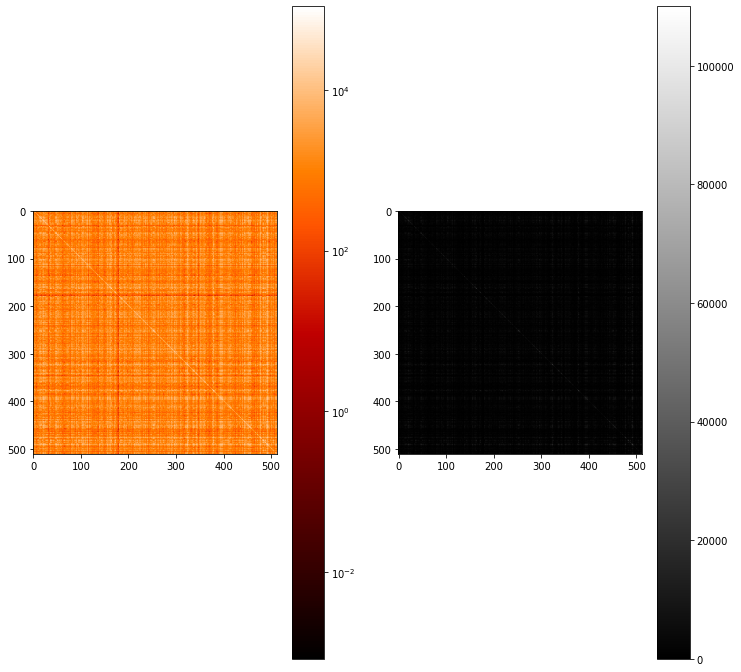

In [0]:
#@title Visualizing the gram matrix
import matplotlib.pyplot as plt
import matplotlib.colors as colors

BLOCK = 'block5_conv1'
fig, ax = plt.subplots(1, 2)
gram_result = np.squeeze(results['style'][BLOCK].numpy())
pcm = ax[0].imshow(gram_result, cmap="gist_heat", norm=colors.LogNorm())
fig.colorbar(pcm, ax=ax[0])

pcm = ax[1].imshow(gram_result, cmap="gray")
fig.colorbar(pcm, ax=ax[1])

Above we can see what the values of a
Gram Matrix are.  Both plots show the same values but the left plot is scaled logarithmicly  and the right one is scaled linearly(there are some white points on the right plot, they are just hard to notice). The result shows that the gram matrix is symetric. This makes sense since the correlation between two feature maps is commuative ($\operatorname{correlation}(a,b) = \operatorname{correlation}(b,a)$).

What stands out is the **grid like structure** of the Gram Matrix. 
This might be explained with the importance of some features that are strongly present over the whole image. Consequently, the correlation of this feature with all other features is automatically higher. This might lead to the grid like structure. 

### The loss
We already mentioned that the CNN is not trained during NST. What is trained (or rather optimized) instead is the output image $I$. It should match the style of style image $S$ and content of the content image $C$. Thus, it is made out of two parts

* style loss $\sum_{l}^{L_S}\ (G[I]_{l}-G[S]_{l})^2$
* content loss $\sum_{l}^{L_C}\ (F[I]_{l}-F[C]_{l})^2$

which are then weighted with $w_{s/c}$ summed together
* $w_{s}*style\:loss + w_{c}*content\:loss$


$L_S$ are the layers used for the style representation (denoted as style layers) whereas $L_C$ are the layers used for content representation (denoted as content layers). Usually, only one layer is used for content. The choice of the content and style layers has a great influence on the genereated image.
The picure below shows an illustration of the loss function. 
![Architecture of NST](https://miro.medium.com/max/971/1*ZgW520SZr1QkGoFd3xqYMw.jpeg)

## Why using VGG-19
All implementations and variations of NST (and DPH), we came across so far are either using VGG-16 or VGG-19. Luan, who wrote the DPH paper is using VGG-19 and so do we. 
For further understanding, it might be helpful to know why the VGG architecture is so usefull for style transfer. 

![alt text](https://neurohive.io/wp-content/uploads/2018/11/vgg16-1-e1542731207177.png)

Above we can see the VGG-19 architecture. It has 19 layers and only uses 3x3 convolution with ReLu activations and max pooling before the fully connected layers. 

As mentioned in the slides of this lecture, the key aspect of VGG are multiple small kernels in a row instead of single large kernel. Putting multiple small kernels in row yields to the same receptive field size as single large kernel. Two 3x3 kernels, one after another, have a receptive field of 5x5, three 3x3 kernel in a row have a receptive field size of 7x7. In comparison with a 7x7 convolutional kernel, three 3x3 kernels in row only have half the weights to train. So information is stored more densly in small convolutional kernel stored one after another compared to one big convulutional kernel.

Furthermore, more layers lead to more non-linearities and to more discriminative activation functions. We assume that these additional non-linearities lead to a better feature detection. Good feature detection might be important for NST.






# Our own model
Deep painterly harmonization (DPH) consists of two passes.  
![passes](https://drive.google.com/uc?id=1YUEv_G8JfNV32B9DZhe_ErJOBQR91XiZ)  
In the first pass, the sticker is robustly adjusted to the style of the image.  In the second pass the style is more finely adjusted.

Our code is based on [this NST implementation](https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/generative/style_transfer.ipynb).


# First Pass

This section describes how the first pass is working.


The first pass just works like NST. The content image $C$ is the one with the sticker and the style image $S$ is the one without the sticker. The only difference betweeen NST and the first pass of DPH is that the style target $G[S]$ is not simply made up by $S$. It is made up by an altered version of $S$ which we will call $S'$. So the style target of the first pass is denoted as $G[S']$.
 

### Independent Mapping
We get $S'$ by replacing some values from layer outputs $F[C]$ with similiar values of $F[S]$. This replacing process is called independent mapping. 

In order to describe this independent mapping, we need to declare what a so called *activation vector* is at first. The illustration below shows an example of the output $F_l[C]$.

![alt text](https://drive.google.com/uc?id=1oCRnjmmbPQThlCRhBNCIMXwoLmEDAXom)

In this illustration, $F_l[C]$ consists of 4 feature maps with size 7x7. The red blocks form an activation vector $\vec{a}$. This vector goes through all feature maps of layer $l$. So all values in $\vec{a}$ represent different features from the same position of the image  $C$.   

For the independent mapping, all activation vectors $\vec{a_c}$ from $F[C]_l$ that are in the position of the sticker are replaced by an similiar activation vector $\vec{a_s}$ from the corresponding style image output $F[S]_l$. 
How do we define similiarity? We simply take the nearest neighbor.

$NearestNeighbor(\vec{a_c}) = \arg \min_{\vec{a_s}\in F[S]_l} (\vec{a_c} - \vec{a_s})^2$

Note that outside the sticker $S$ and $C$ look the same, which means that $F[S]_l$ and $F[C]_l$ are the same outside the sticker as well.

We are not done yet with the independent mapping yet. The activation vector covers only a small part of the image (or rather the corresponding feature map). In order to get a more appropriate nearest neighbor, we want something that covers more space of the image. Look at the illustration below. The blue 3x3 patch arround the red activation vector covers more space of the image.  

![alt text](https://drive.google.com/uc?id=12O44X4yUMhPauc0WmUIXlXC28iFMc-nN)

The black ellipse is the sticker (rescaled to the size of the feature maps of layer $l$). All activation vectors that are covered by the sticker are marked with black horizontal stripes.

The blue 3x3 patch covers nine times the space of the image than the red activation vector does. It maintains the surrounding context of the activation vector. 
This is why we actually do not use the activation vector for finding the nearest neighbors. We use the surrounding patch $P_{a}$ of activation vector $\vec{a}$. So the formula for finding the nearest neighbor actually looks like this. 

$NearestNeighbor(\vec{a_c}) = \arg \min_{\vec{a_s}\in F[S]_l} (P_c - P_a)^2$

with $P_c$ as the patch of $\vec{a_c}$ and $P_s$ as the patch of $\vec{a_s}$


Using patches allows us to get a nearest neighbor considering the surrounding context of the activation vector. The last remaining question is why is the Independent Mapping called independent? The mapping process is done independently for each neural layer $l \in L_{S}$. The mapping of one layer has no influence on the mapping of another layer. According to Luan et al. this makes the first pass more robust to outliers but also leads to weak texture and artifacts in the generated image of the first pass.

The secondary pass uses a consistent mapping which means that only a single reference layer is mapped and all other style layers $l \in L_{S}$ simply copy the mapping positions of the reference layer.





In [0]:
def independent_mapping(input_image_neural_activations, mask, style_neural_activations):
  
  layers = input_image_neural_activations.keys()
  nearest_neighbor_style_mapped = {}
  nearest_neighbor_distance = {}

  # Iterate through layers
  for layer_name in layers:

    print("Independent mapping: processing " + layer_name)
    
    # both have shape:  (1, height, width, number_of_feature_maps Nl)
    input_image_layer_activation = input_image_neural_activations[layer_name]
    style_layer_activation = style_neural_activations[layer_name]
    
    # Initialize default nearest_neighbor_style
    nearest_neighbor_style_mapped[layer_name] = np.copy(style_layer_activation)

    # Intitialize nearest_neighbors distance
    # Only used for tensorboard
    nearest_neighbor_distance[layer_name] = np.zeros(shape=(input_image_layer_activation.shape[:3] + (1,)), dtype=np.float32)
    current_nearest_neighbor_distance = nearest_neighbor_distance[layer_name] #TECHNICALLY

    # Size of feature map
    height = input_image_layer_activation.shape[1]
    width =input_image_layer_activation.shape[2]
    
    # Trim style_layer_activation so that its shape is divisilbe without rest for PATCH_SIZE
    #TECHNICALLY
    trimmed_height = height - (height%PATCH_SIZE)
    trimmed_width  = width - (width%PATCH_SIZE)
    style_layer_activation = style_layer_activation[:,:trimmed_height, :trimmed_width, :] 

    # Resize the mask to the feature map
    mask = tf.image.resize(mask, (height, width))
    mask = np.around(mask)
    
    # Iterate through input_image
    for i in range(height):
      for j in range(width):

        # Check if the feature is inside mask
        if mask[0,i,j,0]:
          
          print(".", end="")

          #TODO CONSIDER PADDING
          # 3x3 patch arround the center
          input_patch = input_image_layer_activation[:, i-P:i+P+1, j-P:j+P+1, :]
          
          nn_index, distance = find_nearest_neighbor(input_patch, style_layer_activation, return_distance=True)
          current_nearest_neighbor_distance[:,i,j,:] = [distance]

          nn_i = nn_index[1]*PATCH_SIZE + P
          nn_j = nn_index[2]*PATCH_SIZE + P
          nearest_neighbor_style_mapped[layer_name][:,i,j,:] = style_layer_activation[:,nn_i,nn_j,:]
    print(".")

  return nearest_neighbor_style_mapped, nearest_neighbor_distance

## Execution of Independent Mapping
These are the images we use for DPH. On the left is the content image, in the middle the style image and on the right the mask which our algorithm needs to differentiate between the sticker and rest of the image.

212992/207476 [==============================] - 0s 0us/step


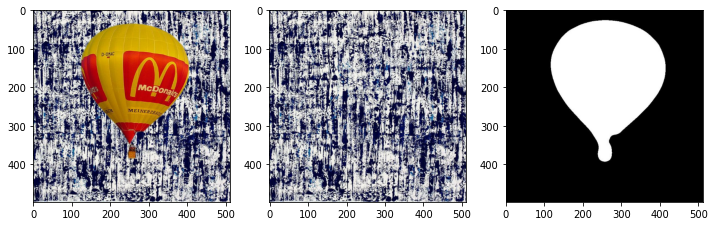

In [0]:
#@title The image set
# Loading pictures
mask_path = tf.keras.utils.get_file(IMAGE_SET + 'mask.jpg', image_paths[IMAGE_SET][0])

input_image_path = tf.keras.utils.get_file(IMAGE_SET + 'input.jpg', image_paths[IMAGE_SET][1])

style_path = tf.keras.utils.get_file(IMAGE_SET + 'style.jpg', image_paths[IMAGE_SET][2])

intermediate_official_path = tf.keras.utils.get_file(IMAGE_SET + 'intermediate_official.jpg', image_paths[IMAGE_SET][3])

input_image = load_img(input_image_path)
style_image = load_img(style_path)
mask_image = load_img(mask_path)

plt.subplot(1, 3, 1)
imshow(input_image)

plt.subplot(1, 3, 2)
imshow(style_image)


plt.subplot(1, 3, 3)
imshow(mask_image)

In [0]:
# First Pass
print("Starting first pass...")
print('')

# Only the neural activations of the layers used for the style are important for the independent mapping
style_neural_activations       = neural_activation_model(style_image)['style_layers']
input_image_neural_activations = neural_activation_model(input_image)['style_layers']

input_to_style_mapping, feature_distance_map = independent_mapping(input_image_neural_activations, mask_image, style_neural_activations)

Starting first pass...

Independent mapping: processing block1_conv1
...................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

### Visualize the independent mapping

The plots below show the nearest neighbor distance of the independent mapping.

Keep in mind that the colorbar of the image plots (on the left) are scaled independently of each other, whereas the histograms y-axis are scaled all the same which make them easily comparable. However, due to the ["Curse of dimensionality"](https://de.wikipedia.org/wiki/Fluch_der_Dimensionalit%C3%A4t) comparing the nearest neighbor distance of different layers makes only partially sense since the outputs of different layers have also different dimensionality. The dimensionality of a layer output is given by the number of feature maps it has. This is why we printed the number of feature maps above the coresponding histogram in order to show where it makes sense to compare.

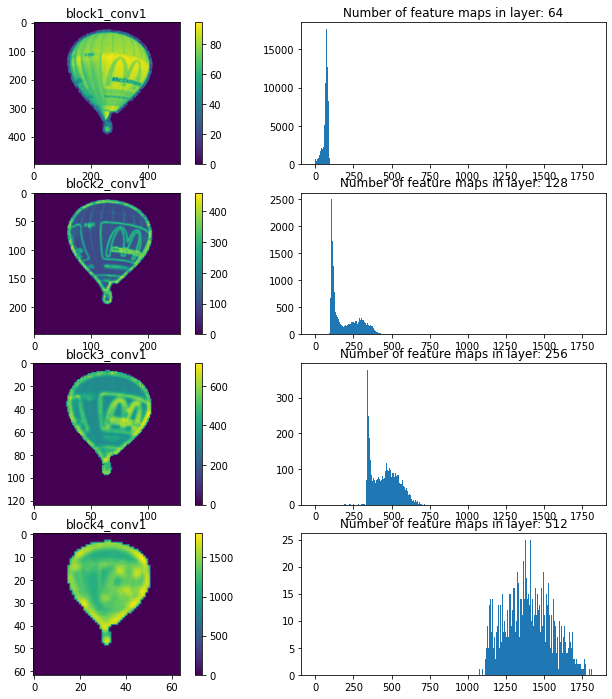

In [0]:
#@title Nearest neighbor distance
max_distance = 0
for distance_map in feature_distance_map.values():
  if distance_map.max() > max_distance:
    max_distance = distance_map.max()

for counter,(key, value) in enumerate(feature_distance_map.items()):
  
  plt.subplot(num_style_layers, 2, 2*counter +1)
  imshow(value, title=str(key))
  plt.colorbar()

  plt.subplot(num_style_layers, 2, 2*counter +2)
  plt.hist(value.ravel(), bins=300, range=(1e-3, max_distance))
  plt.title("Number of feature maps in layer: " 
            + str(style_neural_activations[str(key)].shape[-1]))


In layer *block4_conv1* the distances are far bigger than in the other layers. We have observed that for other image sets *block4_conv1* has bigger distance values, too. So there is a general tendancy that the nearest neighbor distances in this layer is much bigger than in the other layers. In general it seems that the above data supports the thesis of the curse of dimensionality.   

However there might be another reason for the big nearest neighbor distances in layer *block4_conv1*. A look in the statistics of the layer output in the cell below reveals that the average output values of *block4_conv1* are 3 times larger compared to *block3_conv1* and *block2_conv1*. So not only is there more space between activation vectors in deeper layers due to their higher dimensionality but also because their element wise values are higher, too. 

In [0]:
print_layer_statistics(input_to_style_mapping)

block1_conv1
Shape: (1, 498, 512, 64)
Min: 0.00
Mean: 41.67
Max: 795.83

block2_conv1
Shape: (1, 249, 256, 128)
Min: 0.00
Mean: 272.73
Max: 4611.39

block3_conv1
Shape: (1, 124, 128, 256)
Min: 0.00
Mean: 248.22
Max: 10469.57

block4_conv1
Shape: (1, 62, 64, 512)
Min: 0.00
Mean: 745.54
Max: 20079.58

Total mean: 327.04


Below we can see the statistics for the correspoding gram matrix. The means are roughly squared compared to the means of the ungramatized neural outputs (the cell above). 

In [0]:
print_layer_statistics(gramatize(input_to_style_mapping))

block1_conv1
Shape: (1, 64, 64)
Min: 0.00
Mean: 2210.69
Max: 36693.85

block2_conv1
Shape: (1, 128, 128)
Min: 0.00
Mean: 83901.21
Max: 879373.12

block3_conv1
Shape: (1, 256, 256)
Min: 0.00
Mean: 64655.14
Max: 1818858.38

block4_conv1
Shape: (1, 512, 512)
Min: 0.00
Mean: 574211.75
Max: 29174588.00

Total mean: 181244.70


### Choosing the right style layers

Various blog posts about neural style transfer[¹](https://towardsdatascience.com/experiments-on-different-loss-configurations-for-style-transfer-7e3147eda55e?gi=cd3188c36db6) [²](https://towardsdatascience.com/how-to-get-beautiful-results-with-neural-style-transfer-75d0c05d6489) show that choosing the right style and content layers makes a great difference for the resulting output image but how do you know which layers are most important? 

The question whether the output image matches the style of the style image is subjective. This makes chosing the right configuration an subjective task. 

Nonetheles, this does not mean that chosing the "best" configuration has to be a  headless try and error approch. By using an approach fimiliar with the "visualization by optimization" approach, you can visualize the style of different layers[¹](https://towardsdatascience.com/experiments-on-different-loss-configurations-for-style-transfer-7e3147eda55e?gi=cd3188c36db6) [²](https://towardsdatascience.com/how-to-get-beautiful-results-with-neural-style-transfer-75d0c05d6489). In order to do so, you simply have to chose only one style layer, set the content weight to zero and use plain noise as input image. 



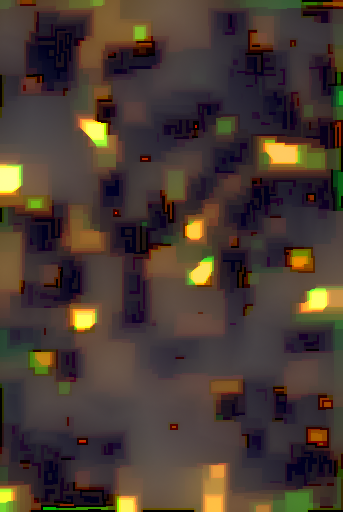

Gatys Reconstruction train step: 1000
Gatys Reconstruction time: 18.5


In [0]:
#@title Visualization by optimization (failed)
style_targets = gramatize(input_to_style_mapping) #G[P] in paper  
style_visualized = {}
style_targets_list = style_targets
for style_targets in style_targets_list.items():
  layer_name = style_targets[0]
  style_targets ={layer_name: style_targets[1]}

  style_layers = [layer_name]
  neural_activation_model = StyleContentModel(style_layers, content_layers)
  input_image = tf.random.normal(input_image.shape, mean=0.5, stddev=0.3)
  input_image = clip_0_1(input_image)
  output = gatys_reconstruction(input_image)
  
  style_visualized[layer_name] = output


As you can see above, this did not work out as expected. All generated images, no matter what style layer was chosen, looked similiar to this one. As mentioned in the lecture, an additional regularization term is needed to prevent high frequency blurs. We used the total varation loss for that but that did not really help. We also jittered the image as a regularization technique but it turned out that this is complicated to implemented by ourselfs since the gradient needs to be adjusted for jittered images. Using an existing implementation is also not an option since the only [tensorflow library](https://github.com/kvfrans/feature-visualization) for feature visualization is out of date. 

## Executing the first pass

### Single layer reconstruction

Nonetheless, there is a way to compare the impact of different style layers. We simply used one style layer at the time for the first pass. Below we can see the configuartion all our further experiments share. 

In [0]:
style_weight=1e-2
content_weight=1e4

content_layers = ['block5_conv2'] 

Due to the different statistical values for the gram matrix of each style layer. We decided to scale the style weight according to these statistics. This raises the style weight of all layers except *block4_conv1*. 
Below we can see how the scaling is done for the first layer *block1_conv1*. The values are taken from [the gram statistics cell.](https://colab.research.google.com/drive/1PJ-NCpyHhu3MyuPG-dB9waCXAi_iZO6K#scrollTo=CjmOL9x8Omwn&line=1&uniqifier=1)

In [0]:
#style_weight = style_weight * total_mean / gram_mean
style_weight = style_weight * 181244 /2210

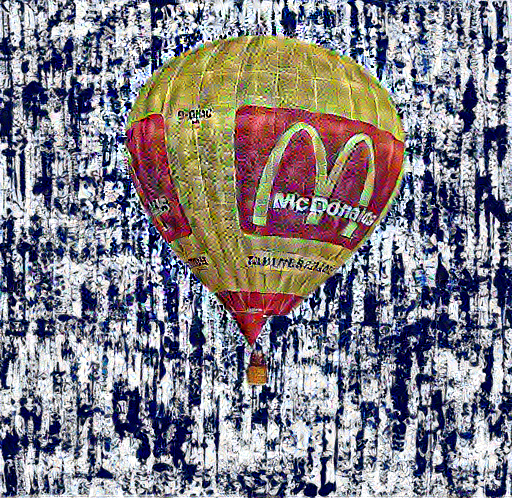

Gatys Reconstruction train step: 1000
Gatys Reconstruction time: 51.3


In [0]:
#@title Conv1_1
# Definte the targets for the loss function
style_targets = gramatize(input_to_style_mapping) #G[P] in paper           
content_targets = neural_activation_model(input_image)['content_layers'] #F[I] in paper

intermediate_image = gatys_reconstruction(input_image)

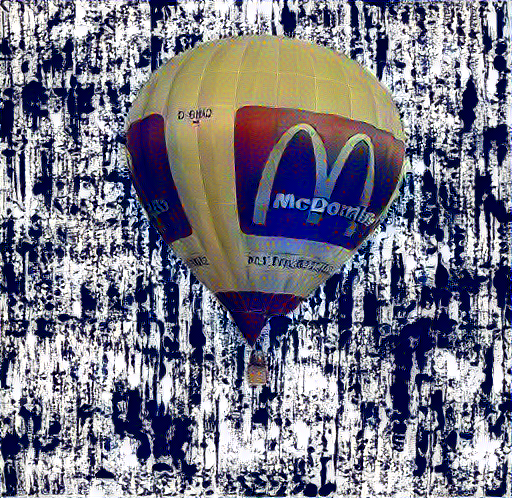

Gatys Reconstruction train step: 1000
Gatys Reconstruction time: 49.5


In [0]:
#@title Conv2_1
# Definte the targets for the loss function
style_targets = gramatize(input_to_style_mapping) #G[P] in paper           
content_targets = neural_activation_model(input_image)['content_layers'] #F[I] in paper

intermediate_image = gatys_reconstruction(input_image)

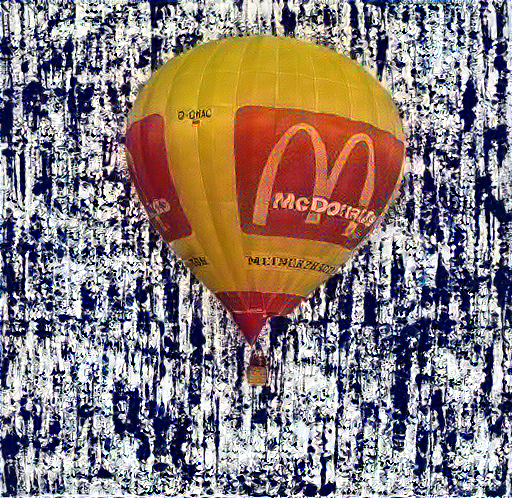

Gatys Reconstruction train step: 1000
Gatys Reconstruction time: 48.5


In [0]:
#@title Conv3_1
# Definte the targets for the loss function
style_targets = gramatize(input_to_style_mapping) #G[P] in paper           
content_targets = neural_activation_model(input_image)['content_layers'] #F[I] in paper

intermediate_image = gatys_reconstruction(input_image)

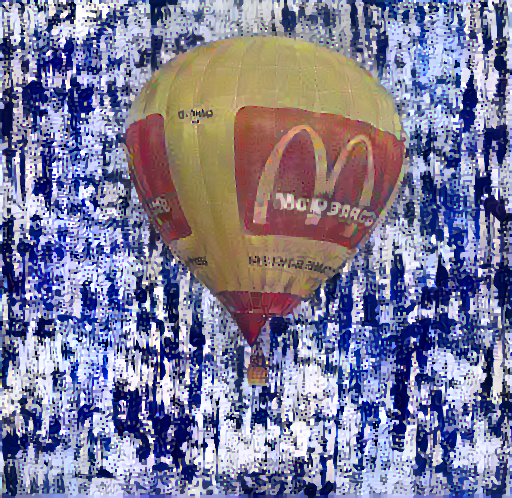

Gatys Reconstruction train step: 1000
Gatys Reconstruction time: 49.3


In [0]:
#@title Conv4_1
# Definte the targets for the loss function
style_targets = gramatize(input_to_style_mapping) #G[P] in paper           
content_targets = neural_activation_model(input_image)['content_layers'] #F[I] in paper

intermediate_image = gatys_reconstruction(input_image)

As already mentioned, all style weights are scaled up except *block4_conv1*. For *block4_conv1*, it is scalled down. There is not much happend in the cell above. So we decided to repeat the cell above but with the unscaled, 3 times bigger style weight.   The resulting image looks very different to the scaled one.


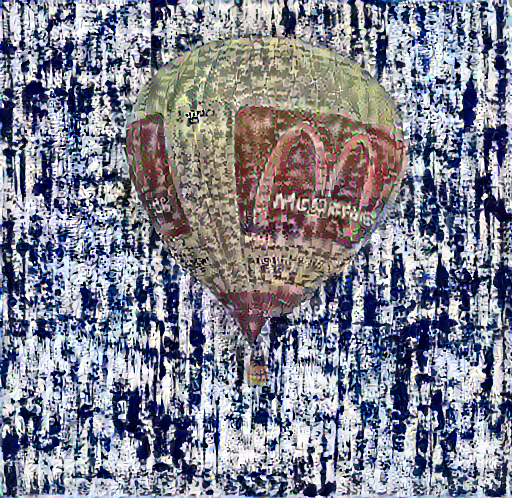

Gatys Reconstruction train step: 1000
Gatys Reconstruction time: 48.4


In [0]:
#@title Conv4_1 unscaled
style_weight=1e-2

# Definte the targets for the loss function
style_targets = gramatize(input_to_style_mapping) #G[P] in paper           
content_targets = neural_activation_model(input_image)['content_layers'] #F[I] in paper

intermediate_image = gatys_reconstruction(input_image)

### Combing the best style layers
We consider the images generated by style layer *block2_conv1* and *block4_conv1 unscaled* as the best ones. So we generated an image using both these layers as style images and using simply the standart style_weigth.

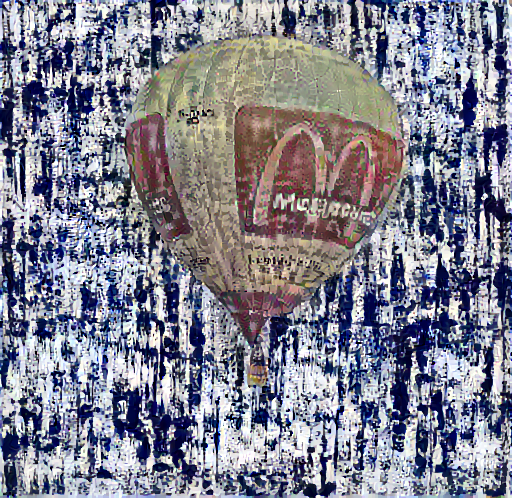

Gatys Reconstruction train step: 1000
Gatys Reconstruction time: 90.8


In [0]:
#@title Conv4_1 and 2_1 combined (final config)
# Definte the targets for the loss function
style_targets = gramatize(input_to_style_mapping) #G[P] in paper           
content_targets = neural_activation_model(input_image)['content_layers'] #F[I] in paper

intermediate_image = gatys_reconstruction(input_image)

In tensorboard we can see that the loss functions are naturally smooth. This is no surprise since tensorboard shows that the tv_loss is very high. The loss of *block4_conv1* is also multiple times higher than the loss of *block2_conv1*. 

In [0]:
%tensorboard --logdir logs/gradient_tape

<IPython.core.display.Javascript object>

### Evaluation of Reconstruction

**Below you can see the papers official result after the first pass for comparision**. Red turned into blue and yellow almost vanished. Unfortunatelly, we could not use the papers official configuration because it uses [L-BFGS](https://www.tensorflow.org/probability/api_docs/python/tfp/optimizer/lbfgs_minimize), a rather exotic optimizer that uses an approximation of the second derivative. The API of L-BFGS is completly different from the optimizers we know so far and we were not able to integrate it in our code base. 

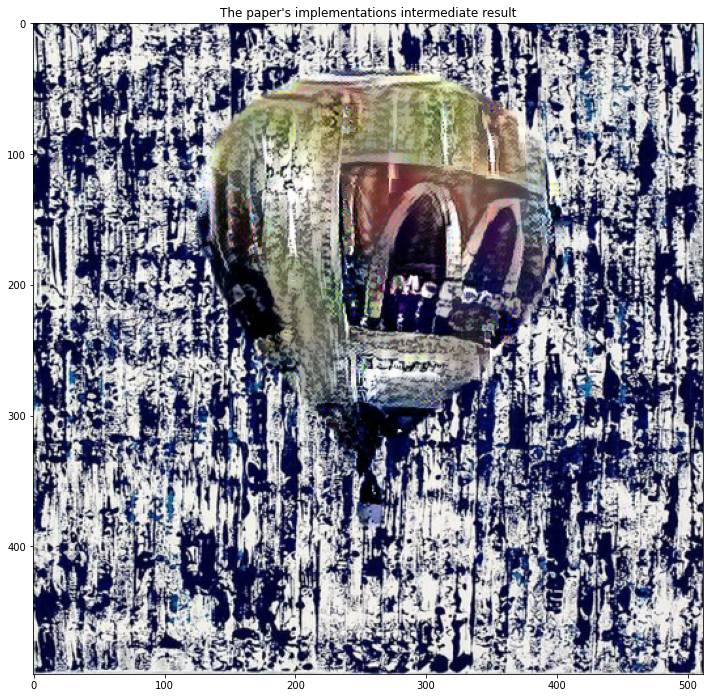

In [0]:
# For comparision, this is the official intermediate result
intermediate_official = load_img(intermediate_official_path)
imshow(intermediate_official, title="The paper's implementations intermediate result")

# Second Pass

The second pass is roughly structured like the first pass. As input we have the output image of the first pass (hereinafter referred to as the intermediate image $I'$), which is shown above, then we again have the mask marking the area in which the sticker form the content image lies, and we have the style image still containing the information of the art style we want to apply to our input image. We first create another mapping between some activation layers of input image and style image, called "consistent mapping". Then we create our targets for the image reconstruction using this mapping. The result of this final reconstruction will be our final output. 



## Consistent Mapping

The consistent mapping is a little more complex than the independent mapping. It uses some functions which we already introduced in the first pass and will not be described in detail again. As input we have the neural actiavions $F[I']$ and $F[S]$ of the VGG19 in specific layers $l$ for the intermediate image $I'$ and the style image $S$ and we have the mask $M$. The output will be a mapping $P_{out}$ between $F[I']$ and $F[S]$.

In the following we will talk about mappings $P(l, p)$. This can be read as follows: $P(l, p)$ outputs the 2D  coordinates  of an activation vector $\vec{b} \subset F_l[S]$ of layer $l$.
It takes the sticker activation vector $\vec{a} \subset F_l[I']$. So the mapping finds a similiar activation vector $\vec{b}$ for $\vec{a}$. Those coordinates are determined by the Consistent Mapping, the VGG19 layer $l$ and the input 2D coordinates $p$ of an activation vector $\vec{a} \subset F_l[I']$.

### The Algorithm

The consistent mapping is done within three different steps which will be described one by one in the following.

#### First Step

First we create a nearest neighbor mapping $P(l_{ref}, p)$ between $F_l[I']$ and $F_l[S]$ for a single reference layer $l_{ref}$ as we did in the independent mapping while $p \in M'$ is part of the resized mask $M'$ which is is the mask $M$ resized so it matches the 2D measurements of the feature maps in layer $l_{ref}$. The reference layer $l_{ref}$ is defined in the configuration setting. Luan et al. recommend using *block4_conv1* as $l_{ref}$.

#### Second Step

In the second step we enforce spatial consistency. This means that we try to remove artifacts in border regions of the image as we see them in the intermediate image shown above. We see several spatial artifacts which may result from breaking adjacencies of style vectors and randomly spreading them around the sticker. Luan et al. address this issue by updating the global nearest neighbor mapping with style vectors from the [Moore Neighborhood](https://en.wikipedia.org/wiki/Moore_neighborhood) within the input image. 

First we lookup the nearest neighbor's style coordinates $q = P(l_{ref}, p)$ for activation vector $\vec{a}$. Then we define a set of update candidates $CSet$ for this specific mapping relation which contains $q$ and for each moore neighbor $p + o$ of $p$ the opposite moore neighbor $q_n = P(l_{ref}, p + o) - o$ in the style feature map while $o \in O = \{N,NE,E,SE,S,SW,W,NW\}$ is the neighborhood offset (as cardinal points). So we have a set of update candidates which each represent a style adjacency for each moore neighbor of $p$. Now we update our nearest neighbor mapping $P(l_{ref}, p)$ with the best matching candidate. The best matching candidate is the one with the least squared error for all style mappings which are adjacent to $p$. This error is determined by the difference of the candidate $c$ to the nearest neighbor style vectors of all moore neighbors of $p$ as follows:

$$P_{out}(l_{ref},p) = \underset{c \in CSet}{\operatorname{argmin}} \underset{o \in O}{\sum{}} ||F_{l_{ref}}[S]_c - F_{l_{ref}}[S]_{P(l_{ref}, p + o)}||^2$$

![alt text](https://drive.google.com/uc?id=1bhE8MsB45cuXr1Tvills0zMJyTFEzk3N)

The sketch above shows what $P(l, p + o) - o$ means. In this particular case it is $o = NW$.

#### Third Step

Finally we propagate the mapping update we did for our reference layer to all other layers. So for each layer $l \neq l_{ref}$ the mapping $P_{out}(l, p')$ is updated with the corresponding $q'$ (indexing $\vec{b} \subset F_l[S]$) according to $P_{out}(l_{ref}, p) = q$. Doing that we ensure the spatial consistency throughout all layers. Now "all the activation values across all the style layers are assigned style activations that come from the same location in the style image". 

![alt text](https://drive.google.com/uc?id=1DH1381VZgSVJiqWDTJZMBh6fF8XzRgkI)

The image above shows a visualization of the consistent mapping. The left graph shows 49 activation vectors in the middle of $F_l[I']$ for the reference layer *block4_conv1*. The graph in the middle shows the result of the nearest neighbor mapping for these activation vectors in $F_l[S]$. The mapped style vector is displayed with the same color as the corresponding input vector. The right graph shows the mapping update resulting from the consistent mapping function (also $F_l[S]$). 



#### The Code

In [0]:
def consistent_mapping(input_image_neural_activations, mask, style_neural_activations):

    print("\nProcessing consistent mapping with reference layer ", reference_layer)
    
    layers = input_image_neural_activations.keys()
    
    # initialize final mapping
    mapping_out = {}
    for layer_name in layers:
        mapping_out[layer_name] = {}
        
        # Size of feature map
        layer_height = input_image_neural_activations[layer_name].shape[1]
        layer_width = input_image_neural_activations[layer_name].shape[2]
        for i in range(layer_height):
            mapping_out[layer_name][i] = {}
            for j in range(layer_width):
                mapping_out[layer_name][i][j] = np.zeros((2))
  
    # input and style activations in reference layer
    # both have shape:  (1, height, width, number_of_feature_maps Nl)
    ref_input_image_layer_activation = all_output_activations['ref_layers'][reference_layer]
    ref_style_layer_activation = all_style_activations['ref_layers'][reference_layer]

    # Size of feature maps
    ref_input_height = ref_input_image_layer_activation.shape[1]
    ref_input_width = ref_input_image_layer_activation.shape[2]
    ref_style_height = ref_style_layer_activation.shape[1]
    ref_style_width = ref_style_layer_activation.shape[2]

    # Initialize mapping
    # For each input vector the mapping contains the i and j index of the mapped style vector
    nn_mapping = {}

    # Trim style_layer_activation so that its shape is completely divisible by PATCH_SIZE
    # TECHNICALLY, needed for nearest neighbor calculation
    ref_style_trimmed_height = ref_style_height - ref_style_height % PATCH_SIZE
    ref_style_trimmed_width = ref_style_width - ref_style_width % PATCH_SIZE
    ref_style_layer_activation = ref_style_layer_activation[:, :ref_style_trimmed_height, :ref_style_trimmed_width, :]

    # Resize mask to feature map size
    ref_mask = tf.image.resize(mask, (ref_input_height, ref_input_width))
    ref_mask = np.around(ref_mask)

    # 1.: Find nearest neighbor matches for reference layer
    print("Consistent Mapping step 1: Calculating nearest neighbor mapping for reference layer ", reference_layer, "...")

    # S1
    nn_used_indices = []
    
    # mapping
    for i in range(ref_input_height):
        print(int(i * 100 / ref_input_height), end="%, ")

        for j in range(ref_input_width):
            # Check if feature is inside mask
            if ref_mask[0, i, j, 0]:
        
                # cosidering 3x3 patch around the center for neares neighbor mapping
                input_patch = ref_input_image_layer_activation[:, i-P:i+P+1, j-P:j+P+1, :]

                nn_mapping[i, j] = find_nearest_neighbor(input_patch, ref_style_layer_activation)[1:]

    print("100%") 
    
    # 2.: Enforce spatial consistency
    print("Consistent Mapping step 2: Enforcing spatial consistency for reference layer ", reference_layer, "...")
    
    # offsets for moore neighborhood
    offsets = [
                    np.array([-1, -1]),   # NE
                    np.array([-1, 0]),    # E
                    np.array([-1, 1]),    # SE
                    np.array([0, -1]),    # N
                    np.array([0, 0]),     # center -> differs from paper, usefull for this implementation
                    np.array([0, 1]),     # S
                    np.array([1, -1]),    # NW
                    np.array([1, 0]),     # W
                    np.array([1, 1])      # SW
    ]

    for i in range(ref_input_height):
        print(int(i * 100 / ref_input_height), end="%, ")
        for j in range(ref_input_width):
            if ref_mask[0, i, j, 0]:

                # Find best candidate patch in moore neighborhood of the style activations
                
                # coordinates of the input patch p 
                p = np.array([i, j])
                
                # candidate patch style activations
                cset = []
                # collect all candidates 
                for o in offsets:
                    neighbor = p + o # neighbor of p in the input image
                    if not ref_mask[0, neighbor[0], neighbor[1], 0]:
                        # neighbor is not within the sticker, so there is no style mapping for this neighbor patch
                        continue
                    neighbors_style = np.array(nn_mapping[neighbor[0], neighbor[1]])  # mapped style patch for the neighbor
                    c = neighbors_style - o
                    cset.append(c)
                
                # calculate each candidate's error
                errors = []
                for c in cset:
                    error = 0
                    c_activation = ref_style_layer_activation[:, c[0], c[1], :]
                    summation_steps = 0
                    for o in offsets: 
                        neighbor = p + o
                        if not ref_mask[0, neighbor[0], neighbor[1], 0]:
                            # neighbor is not within the sticker, so there is no style mapping for this neighbor patch
                            continue
                        summation_steps += 1
                        neighbors_style = nn_mapping[neighbor[0], neighbor[1]]
                        neighbors_style_activation = ref_style_layer_activation[: , neighbors_style[0], neighbors_style[1], :]
                        error += tf.norm(c_activation - neighbors_style_activation)
                    
                    errors.append(error / summation_steps)
                
                # choose the candidate with the minimal error
                # use the fact that cset and errors have the same indexing
                chosen_index = np.argmin(np.array(errors))
                chosen = cset[chosen_index]

                # TODO: visualize feature map with minimum error highlighted
                # but how...?
                
                # update mapping
                mapping_out[reference_layer][i][j] = chosen

    print("100%")

    
    # 3.: Propagate the matches in the reference layer to the other layers
    
    # Size of style feature map of the reference layer
    ref_style_height = ref_style_layer_activation.shape[1]
    ref_style_width = ref_style_layer_activation.shape[2]
    
    print("Consistent Mapping Step 3: Propagating matches for reference layer to other layers...")
    
    remapped = {}
    for layer_name in layers:
        
        # both have shape:  (1, height, width, number_of_feature_maps Nl)
        l_input_image_layer_activation = input_image_neural_activations[layer_name]
        l_style_layer_activation = style_neural_activations[layer_name]
        
        # Size of input feature map
        l_input_height = l_input_image_layer_activation.shape[1]
        l_input_width = l_input_image_layer_activation.shape[2]
        
        # Size of style feature map
        l_style_height = l_style_layer_activation.shape[1]
        l_style_width = l_style_layer_activation.shape[2]
        
        # Trim style_layer_activation so that its shape is completely divisible by PATCH_SIZE
        # TECHNICALLY
        #l_trimmed_height = l_input_height - l_input_height % PATCH_SIZE
        #l_trimmed_width = l_input_width - l_input_width % PATCH_SIZE
        l_style_layer_activation = l_style_layer_activation[:, :l_style_height, :l_style_width, :]
        
        # Resize mask to feature map
        l_mask = tf.image.resize(mask, (l_input_height, l_input_width))
        l_mask = np.around(l_mask)
        
        if layer_name is not reference_layer:
            
            print("Propagating matches for reference layer to layer ", layer_name)
  
            for i in range(l_input_height):
                for j in range(l_input_width):
                    if l_mask[0, i, j, 0]:
                        # calculate $p' = (i_{ref}, j_{ref})$
                        # p' are feature coordinates in the input image
                        l_i = int(np.around((i * ref_input_height) / l_input_height))
                        l_j = int(np.around((j * ref_input_width) / l_input_width))
                        
                        # Fetch matching style patch in the reference layer
                        # q are feature coordinates in the style image
                        q = mapping_out[reference_layer][l_i][l_j]
                        q_i = q[0]
                        q_j = q[1]
                        
                        # Change resolution back 
                        update_i = np.around((q_i * l_style_height) / ref_style_height)
                        update_j = np.around((q_j * l_style_width) / ref_style_width)
                        
                        # Update mapping for this layer
                        mapping_out[layer_name][i][j][0] = update_i
                        mapping_out[layer_name][i][j][1] = update_j
            
        # apply mapping
        remapped[layer_name] = np.copy(l_input_image_layer_activation)
        for i in range(l_input_height):
            for j in range(l_input_width):
                if l_mask[0, i, j, 0]:
                    # mapping from p to q
                    # p is in the input image activations, q is in the style image activations
                    q_i = int(mapping_out[layer_name][i][j][0])
                    q_j = int(mapping_out[layer_name][i][j][1])
                    remapped[layer_name][:, i, j, :] = l_style_layer_activation[:, q_i, q_j, :]    

    
    print("Consistent mapping finished!")
    return mapping_out, remapped, nn_mapping

## Final Reconstruction

The final reconstruciton works almost the same as the intermediate reconstruction does. The main difference is that the final reconstruciton in the paper uses an aditional loss term: the histogram loss. According to [Wilmot et al.](https://arxiv.org/pdf/1701.08893.pdf) the histogram loss can "ensure that the activation histograms are preserved" (Luan et al.) which shall contribute some stability to the whole loss function.

### Histogram Loss

As target the histogram loss uses the VGG19 feature activations $F_l[O]$ of the output image in specified histogram layers $l$ which are remapped according to a histogram matching to the feature activations $F_l[S]$ of the style image in the same layer. The resulting remapped feature maps are called $R_l[O] = \operatorname{histmatch}(F_l[O], F_l[S])$. Luan et al. recommend using *block1_conv1* and *block4_conv1* as histogram layers. 

Unfortunately our implementation of the histogram loss needs far too much computation time. As shown below the activation histograms of the output image and the style image have not a big difference so we decided not to use it. In the following we will describe the basic algorithm for the computation of the histogram loss as we implemented it.

![alt text](https://drive.google.com/uc?id=18h0UY7RmpUQkxhySu-Ouz4K_pKX97woR)

Above we see the relative cumulative distribution functions for the VGG19 activations in layer *block4_conv1* for the output image (blue) and the style image (orange) after the 500th of 1000 reconstruction steps in the final reconstruction. The x-axis shows the bin index and the y-axis shows the probability. It is obvious that the distributions of the values do not differ much. The functions of other layers in other iterations of the reconstruction do not differ more than that. 

#### The Algorithm

First for each defined histogram layer the histogram mapping of the VGG19 feature activations $F_l[O]$ of the output image to the feature activations $F_l[S]$ of the style target image is computed. To do that we use the function ```tf.histogram_fixed_width``` which computes a histogram distribution to $n$ bins over all single activation values in the layer. As Luan et al. did in their torch implemenation we use $n = 256$. For this histogram bin distribution a cumulative distribution function for the bins is drawn by calculating the cumulative sum for each bin relative to the number of activation values. This is done for both the output image activations and the style image activations. Using ```scipy.interpolate.interp1d``` we create a continuous function over each of the descretely defined cumulative distribution functions. So now we have the following defined:

$$A_O \subset \mathbb{R}^{+} \textrm{ ... the set of possible activation values in the output image activations}$$
$$A_S \subset \mathbb{R}^{+} \textrm{ ... the set of possible activation values in the style image activations}$$
$$A_O^{l} \subset A_O \textrm{ ... the set of occuring activation values in the output image activations in layer $l$}$$
$$c_O^{l}: A_O \to [0, 1] \textrm{ ... the continuous cumulative distribution function for the output activations in layer $l$} $$ 
$$c_S^{l}: A_S \to [0, 1] \textrm{ ... the continuous cumulative distribution function for the style activations in layer $l$} $$

So now for each output image activation $x_O \in A_O^{l}$ we solve the following equation to $x_S \in A_S$ using ```scipy.optimize.fsolve```

$$c_O^{l}(x_O) = c_S^{l}(x_S)$$

which results in a mapping function for each layer $l$:

$$M^{l}: A_O^{l} \to A_S | M^{l}(x_O) = x_S$$

This mapping function is now applied to the activation values of the output image in each layer. The results are the wanted histogram-remapped feature maps $R_l[O]$. Finally the loss value is computed using $R_l[O]$ as target. 



###Evaluation of Reconstruction


In [2]:
%tensorboard --logdir logs/second_pass

Output hidden; open in https://colab.research.google.com to view.

#### The Code

In [0]:
def hist_loss(outputs, mask):
    from scipy.interpolate import interp1d
    from scipy.optimize import fsolve
    num_bins = 256
    decimals = 2 # used for activation mapping
    hist_outputs = outputs['hist_layers']
    hist_loss = 0

    # histogram matching
    r = {}  # histogram targets R[O]
    for layer_name in hist_layers:

        output_activations = hist_outputs[layer_name]
        style_activations = style_neural_activations[layer_name]
        max_val = np.amax([np.amax(output_activations), np.amax(style_activations)])
        value_range = tf.constant([0, max_val], dtype=tf.float32)
        bin_size = max_val / num_bins
        bin_mean = bin_size / 2

        # output histogram
        output_histogram = tf.histogram_fixed_width(output_activations, 
                                                    value_range, 
                                                    nbins=num_bins)
        # mapping from output activation to bin
        output_to_bin = tf.histogram_fixed_width_bins(output_activations, 
                                                    value_range, 
                                                    nbins=num_bins)
        print("Calculated output histogram for layer", layer_name, ".")

        # cumulative distribution function over output activations
        num_output_activations = np.prod(output_activations.shape)
        output_cdf = tf.cumsum(output_histogram) / num_output_activations
        print("Calculated cumulative distribution function over output activations for layer", layer_name, ".")

        # style histogram
        style_histogram = tf.histogram_fixed_width(style_activations, 
                                                   value_range, 
                                                   nbins=num_bins)
        print("Claculated style histogram for layer", layer_name, ".")
        num_style_activations = np.prod(style_activations.shape)
        # cumulative distribution function over style activations
        style_cdf = tf.cumsum(style_histogram) / num_style_activations
        print("Calculated cumulative distribution function over style activations for layer", layer_name, ".")
        
        
        
        # plot cdfs
        print("Plotting CDFs for layer", layer_name, ":")
        plt.plot(output_cdf)
        plt.plot(style_cdf)
        plt.ylabel('CDF')
        plt.xlabel('Bin')
        plt.legend(["Output", "Style"])
        plt.show()
        
        # unambiguous mapping from output activation to style activation

        interp_x = np.zeros(num_bins)

        # continuous cdf over real activation values
        for i in range(num_bins):
            interp_x[i] = bin_size * i + bin_mean * (i > 0)
        interp_y = output_cdf.numpy()
        output_cdf_cont = interp1d(interp_x, interp_y, bounds_error=False, fill_value="extrapolate")
        
        # continuous cdf over real activation values
        interp_y = style_cdf.numpy()
        style_cdf_cont = interp1d(interp_x, interp_y, bounds_error=False, fill_value="extrapolate")
        
        # create mapping from output activation to style activation by solving $$F1(x1) = F2(x2)$$
        # round activations for performance
        unique_output = np.unique(np.around(output_activations, decimals))
        print("Calculating histogram mapping over", unique_output.shape[0], "unique values.")
        hist_mapping = {}
        for x1 in unique_output:
            def root_eq(x2):
                return output_cdf_cont(x1) - style_cdf_cont(x2)
            # solve F1(x1) - F2(x2) = 0 | x1 is constant 
            hist_mapping[x1] = fsolve(root_eq, x1)
        
        # remap to get $$R_l[O]$$
        # TODO: change output number of activations to be remapped: only within mask 
        print("Remapping output, generating R_l[O] for layer", layer_name, ". There are", num_output_activations, "values to be remapped.")
        r[layer_name] = np.zeros(output_activations.shape)
        # only remap feature vectors within mask
        l_mask = tf.image.resize(mask, (output_activations.shape[1], output_activations.shape[2]))
        l_mask = np.around(l_mask)
        for i in range(output_activations.shape[1]):
            for j in range(output_activations.shape[2]):
                if l_mask[0, i, j, 0]:
                    for k in range(output_activations.shape[3]):
                        r[layer_name][:, i, j, k] = hist_mapping[np.around(output_activations[0, i, j, k].numpy(), decimals)]

        
    # Calculate real histogram loss
    print("Remapping finished. Claculating loss.")
    hist_loss += tf.add_n([tf.reduce_mean((hist_outputs[name] - r[name]) ** 2) 
                           for name in hist_layers])
    hist_loss *= hist_weight / num_hist_layers
    print("Histogram loss calculated.")
    
    return hist_loss

In [0]:
def style_loss(outputs):
    # TODO: what is S1 loss?
    style_outputs = gramatize(outputs['style_layers'])
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-gram_targets[name])**2)
                           for name in style_outputs.keys()])
    style_loss *= style_weight / num_style_layers

    return style_loss

In [0]:
def content_loss(outputs):
    content_outputs = outputs['content_layers']
    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2) 
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    return content_loss

In [0]:
def tv_loss(image):
    return total_variation_weight * tf.image.total_variation(image)

In [0]:
#@tf.function()
def final_train_step(image, hist=False):
    with tf.GradientTape() as tape:
        outputs = neural_activation_model(image)
        # hist loss needs far too much computing time
        tv_loss_val = tv_loss(image)
        loss = content_loss(outputs) + style_loss(outputs) + tv_loss_val
        if (hist):
            hist_loss_val = hist_loss(outputs)
            loss += hist_loss_val

    grad = tape.gradient(loss, image)
    opt.apply_gradients([(grad, image)])
    image.assign(clip_0_1(image))

In [0]:
def final_reconstruct(output_image):
    output_image = tf.Variable(output_image)

    import time
    start = time.time()

    step = 0
    for n in range(epochs):
        for m in range(steps_per_epoch):
            step += 1
            #do_hist = step % 100 is 0
            do_hist = False
            final_train_step(output_image, hist=do_hist)
            print(".", end="")

        print("Final reconstruction train step: {}".format(step))


    end = time.time()
    print("Final reconstruction time: {:.1f}".format(end-start))
    return output_image

# Results

![alt text](https://drive.google.com/uc?id=1AbsAt_yqBWHjO0Awzve5pOe-myOsmWcc)
![alt text](https://drive.google.com/uc?id=1VrKg4gbSjL6M7oIgJnWPkPv3Ks0nDIWh)

The first image again shows our intermediate image of the ballon. The second image shows a result of our second step. The art style is much more present in the ballon's surface. The border regions between the sticker and the environment match slightly better with the style. The color theme of the ballon is still preserved which might not be the goal. All in all our implementation of the consistent mapping does it's job, but not as good as the original software in torch. 

Our final loss weights for this specific run were:
- style: 0.001
- content: 1000
- total variation: 30

## Bonus: Obligatory Corona image

![toiletpaper1](https://drive.google.com/uc?id=1zyzwLJtfUmjVPIor3iWTXdmsCLwmxsLQ)  

![toiletpaper2](https://drive.google.com/uc?id=1vHDfh1UffXQtNHOwNySQ-42GVc-l-62i)

